# BERT based Classification and Prediction - Fine-Tuning Models 

---

__Author:__ Shreyansh Padarh <br>
__Email:__ shreyansh.padarha@hotmail.com<br>
__Linkedin:__ https://www.linkedin.com/in/shreyansh-padarha/<br>

---

## Datasets under Consideration
1. **Genre** Classification based on Movie Script
2. **Rating** Prediction based on Movie Script
3. **Movie Age Restriction** based on Movie Script

# Understanding BERT (Bidirectional Encoder Representations from Transformers)

## BERT Base vs BERT Large

- BERT is an Encoder stack of the transformer architecture.
- Transformer architecture is a network with self-attention on the encoder side and attention on the decoder side.
- BERTBASE has 12 layers in the Encoder stack, while BERTLARGE has 24 layers.
- BERT architectures have more layers compared to the original Transformer architecture (6 encoder layers).
- BERTBASE and BERTLARGE also feature larger feedforward networks (768 and 1024 hidden units, respectively).
- The original Transformer architecture suggested 512 hidden units and 8 attention heads, whereas BERTBASE and BERTLARGE have 12 and 16 attention heads, respectively.
- BERTBASE contains 110M parameters, while BERTLARGE has 340M parameters.

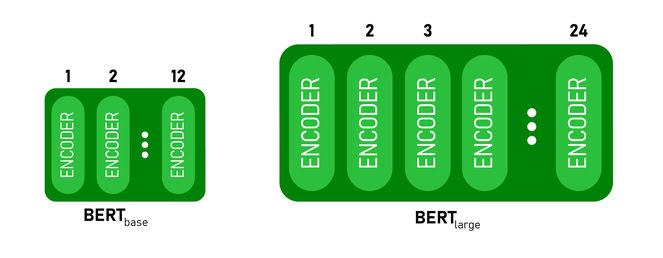

__This study makes use of the BERT-LARGE-UNCASED model.__

## Background: Transformers
**Reference:** Vaswani, A., Shazeer, N., Parmar, N., Uszkoreit, J., Jones, L., Gomez, A. N., ... & Polosukhin, I. (2017). **Attention is all you need**. Advances in neural information processing systems, 30.

### The Transformer Architecture

#### Encoder-Decoder Structure
- The Transformer architecture employs an **encoder-decoder** structure without relying on recurrence or convolutions for sequence-to-sequence tasks.
- The **encoder** maps an **input sequence** to continuous representations, which are then fed into the decoder.
- The **decoder** generates an **output sequence** using the encoder's output and the previous decoder output, and the model is auto-regressive, consuming previously generated symbols for the next step.



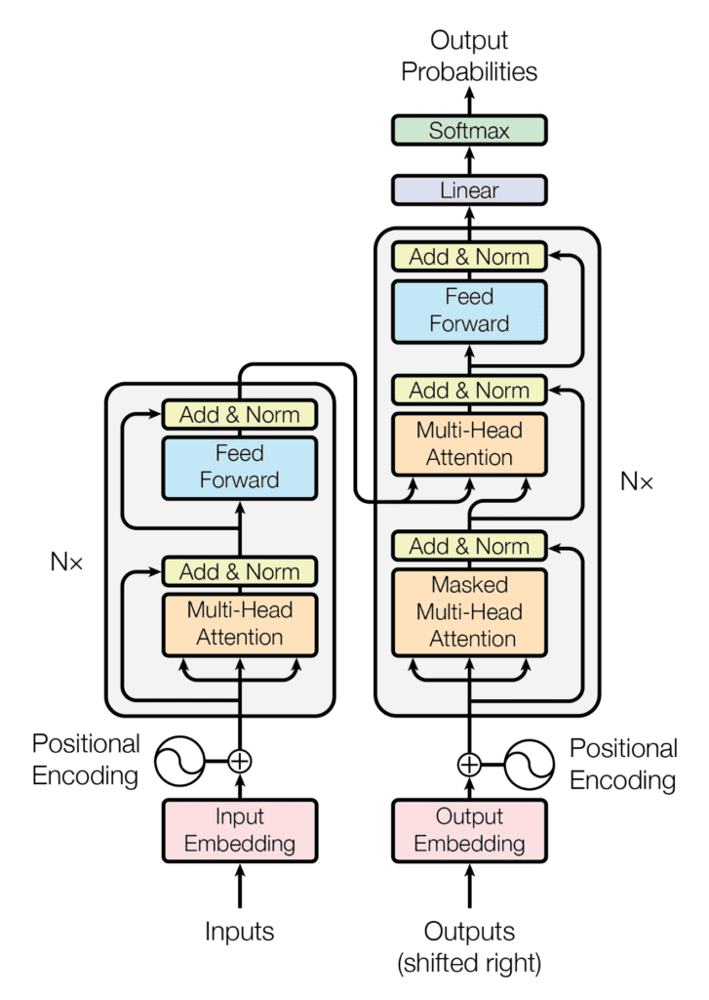



### The Encoder

#### Encoder Block
- The encoder consists of a stack of **6 identical layers**, each composed of **two sublayers**.
- The first sublayer implements a **multi-head self-attention mechanism** with linear projections of queries, keys, and values, producing parallel outputs.
- The second sublayer is a fully connected feed-forward network with **ReLU activation**.
- Each layer applies the same **linear transformations**, with unique weight and bias parameters, and includes residual connections and layer normalization.
- **Positional encodings** are added to input embeddings to convey sequence positions.

#### Positional Encoding
- Transformers lack inherent **positional information**, requiring positional encodings to be added to input embeddings.
- Positional encoding vectors, generated using sine and **cosine functions of different frequencies**, are added to input embeddings to inject positional information.
- This compensates for the absence of recurrence in the architecture.


### The Decoder

#### Decoder Block
- The decoder consists of a stack of **6 identical layers**, each composed of **three sublayers**.
- The first sublayer incorporates positional information, performs **multi-head self-attention** over the previous decoder output, and uses a masked mechanism for attending only to preceding words.
- The **second sublaye** implements a multi-head self-attention mechanism similar to the encoder's first sublayer, attending to all words in the input sequence.
- The third sublayer is a **fully connected feed-forward network** with residual connections and layer normalization.
- Positional encodings are added to the input embeddings of the decoder.

#### Masked Multi-Head Attention

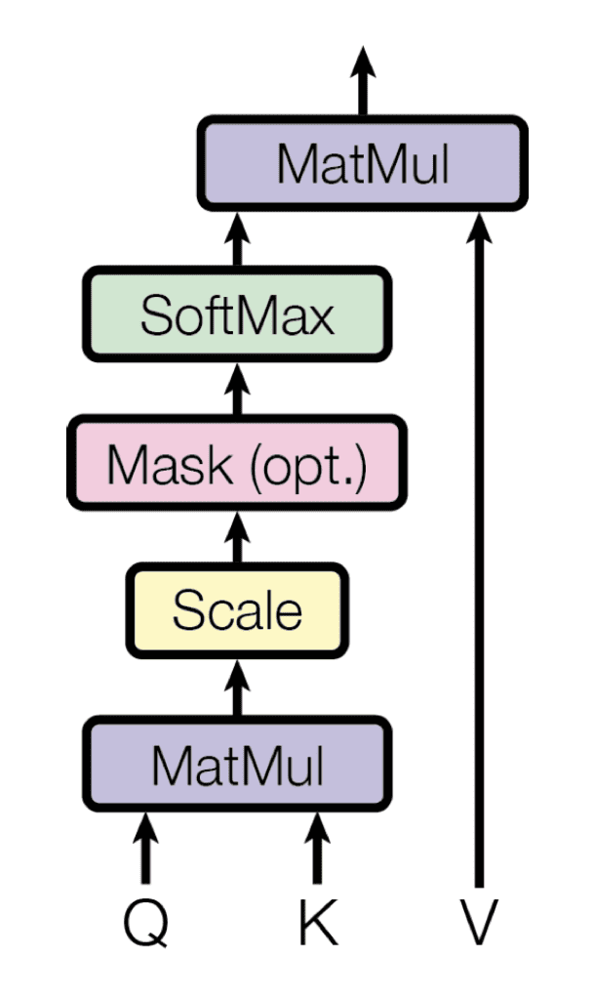

- The first sublayer in the decoder implements a masked multi-head self-attention mechanism to make the decoder unidirectional.
- A mask is applied to the scaled multiplication of matrices, suppressing values corresponding to illegal connections and allowing the decoder to attend only to preceding words.
- This modification ensures that predictions for a word depend only on known outputs from preceding words in the sequence.

## BERT WORKING

#### 1. **Transformer Architecture:**
   - BERT utilizes the Transformer architecture, consisting of an encoder and a decoder.
   - The encoder, responsible for BERT's language modeling, is the focus as BERT aims to generate a language model.

#### 2. **Bidirectional Context Learning:**
   - Unlike directional models, Transformer reads the entire sequence of words simultaneously.
   - It is considered bidirectional, allowing the model to learn word context from both left and right surroundings.

#### 3. **Transformer Encoder Overview:**
   - Input: Sequence of tokens.
   - Token embedding: Tokens are embedded into vectors.
   - Neural network processing: Vectors are processed in the encoder.
   - Output: Sequence of vectors, each corresponding to an input token.

#### 4. **Masked LM (MLM) Strategy:**
   - 15% of words are replaced with [MASK] tokens before input.
   - Model predicts original values of masked words based on context.
   - Prediction involves classification layer, embedding matrix multiplication, and softmax probability calculation.
   - Loss function considers only masked value predictions, leading to slower convergence but enhanced context awareness.

   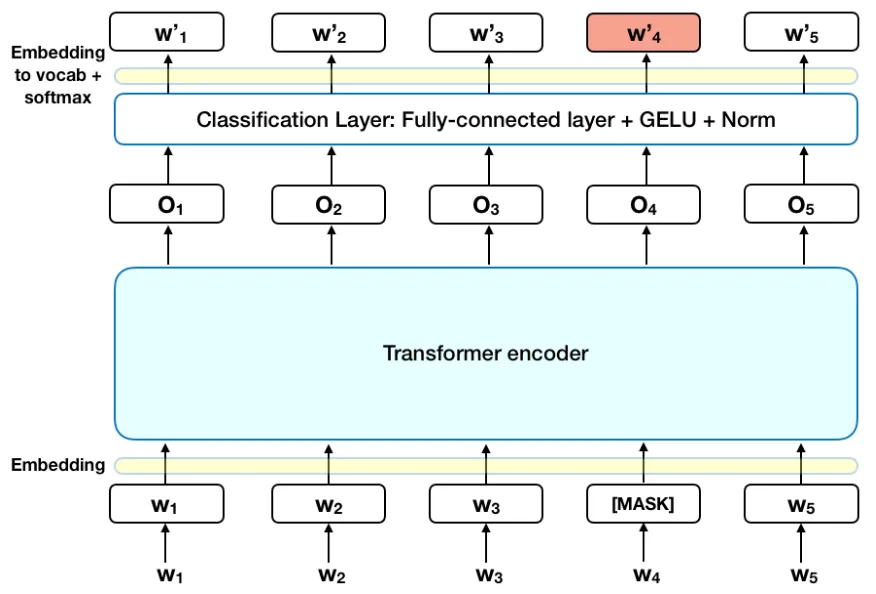

#### 5. **Next Sentence Prediction (NSP) Strategy:**
   - Training involves pairs of sentences, predicting if the second follows the first.
   - Input preprocessing includes [CLS] and [SEP] tokens, sentence embeddings, and positional embeddings.
   - [CLS] token output is transformed to a 2×1 vector for IsNextSequence probability calculation.
   - Combined training with Masked LM aims to minimize the total loss.

   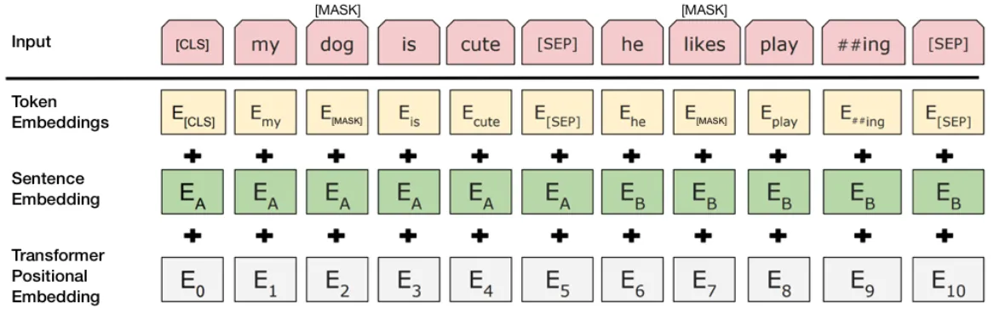

   <center>Figure: Bert Architecture</center>

## FINE-TUNING BERT Model

#### 1. **Task Adaptation:**
   - BERT can be applied to various language tasks by adding task-specific layers to the core model.

#### 2. **Classification Tasks:**
   - For sentiment analysis or similar tasks, a classification layer is added to the Transformer output for the [CLS] token.

#### 3. **Question Answering (QA) Tasks:**
   - In QA tasks like SQuAD v1.1, extra vectors marking the beginning and end of answers are learned.

#### 4. **Named Entity Recognition (NER):**
   - In NER tasks, a classification layer is applied to the output vector of each token to predict the entity type.

#### 5. **Fine-tuning Process:**
   - Hyper-parameters mostly remain consistent with BERT training.
   - BERT's fine-tuning approach achieves state-of-the-art results across diverse natural language tasks (detailed in Section 4).

---

# Importing Required Libraries

In [17]:
#Transformers library
import transformers
from transformers import RobertaTokenizer, TFRobertaModel
from transformers import BertTokenizer, TFBertForSequenceClassification

#Tensorflow Library
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers, models

#Data/File Handling/Analytics Specific Libraries
import glob
import pandas as pd
import pickle
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import MultiLabelBinarizer
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split

# Classification of IMDB User Ratings in Movie Scripts leveraging BERT Model 

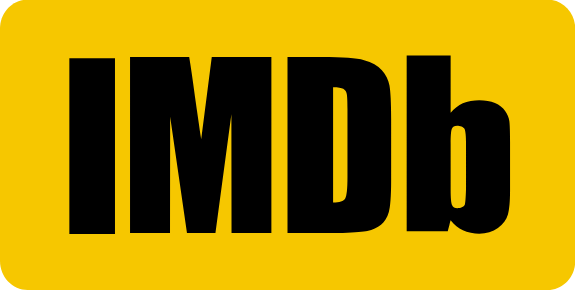

__For Loading BertTokenizer and TFBertForSequenceClassification for the first time.__

# Classification of IMDB User Ratings in Movie Scripts leveraging BERT Model 

## Movie IMDB User Rating Classification (BERT)

__For Loading BertTokenizer and TFBertForSequenceClassification for the first time.__

In [6]:
# #Importing Bert Tokenizer and BertSequenceClassifier
tokenizer = BertTokenizer.from_pretrained('bert-large-uncased')
bert_model = transformers.TFAutoModel.from_pretrained('bert-large-uncased')

# # Saving the models
tokenizer.save_pretrained('bert_tkz')
bert_model.save_pretrained('bert_model')

model.safetensors: 100%|██████████| 1.34G/1.34G [03:50<00:00, 5.84MB/s]
Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the chec

__Dataset__

In [8]:
ratings_df = pd.read_csv('./Data/Processed/ratings_df.csv',index_col=0)

In [9]:
ratings_df.sample(3)

,scripts,imdb user rating
1012,In the b.g. we see the Nine year old Boy sleep...,6
612,The Bridge has been redesigned. A single Capta...,7
832,DAVE (10Want to see some magic? Dave's best/on...,6


In [10]:
ratings_df['imdb user rating'] = ratings_df['imdb user rating'].replace(-1,1)

<AxesSubplot:xlabel='imdb user rating', ylabel='count'>

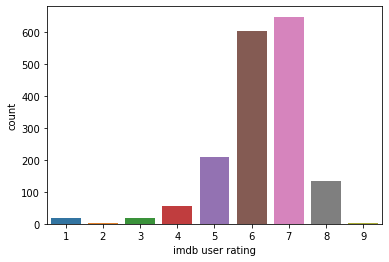

In [11]:
sns.countplot(data=ratings_df,x='imdb user rating')

__Inference:__ It is evident from the figure above that ratings of 6 and 7 are over represented in the data, for the same reason, we employ **ROS (Random Over Sampling)** for creating balanced classes.

### Initialising Tokenizer and Model

1. **Tokenizer Initialization:**
   - `BertTokenizer.from_pretrained('bert_tkz')` initializes a BERT tokenizer using the pre-trained 'bert_tkz' model, enabling tokenization of text into BERT-compatible tokens.

2. **Model Initialization:**
   - `transformers.TFAutoModel.from_pretrained('bert_model', num_labels=1)` initializes a BERT-based model ('bert_model') with TensorFlow compatibility, configured for a binary classification task (num_labels=1).

In [6]:
#Importing Bert Tokenizer and BertSequenceClassifier from offline saved model
tokenizer = BertTokenizer.from_pretrained('bert_tkz')
bert_model = transformers.TFAutoModel.from_pretrained('bert_model', num_labels=1)

2023-11-22 20:02:04.187445: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-22 20:02:04.190623: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-22 20:02:04.190710: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

__Creating Training and Testing Data Split__

In [12]:
# Datafrrame Split with columns 'Rating' and 'Script'
train_data, test_data = train_test_split(ratings_df, test_size=0.25, random_state=42)

__Tokenizing (Encoding) scripts using bert Tokenizer__

In [ ]:
#Tokenizing and encoding the scripts
train_encodings_x = tokenizer(list(train_data['scripts']), truncation=True, padding=True, max_length=512, return_tensors='tf')
test_encodings_x = tokenizer(list(test_data['scripts']), truncation=True, padding=True, max_length=512, return_tensors='tf')

__Encoding Label (imd user rating) to categorical values using tensorflow's ```keras.utils.to_categorical()```__

In [ ]:
#Encoding the labels
trainy_labels_y = tf.keras.utils.to_categorical(train_data['imdb user rating'].values, dtype = 'int32')
test_labels_y = tf.keras.utils.to_categorical(test_data['imdb user rating'].values, dtype = 'int32')

### Random Over Samping

The strategy used in the code chunk below for __random oversampling__ is to balance the class distribution by specifying a target count for each class. In this case, the `sampling_strategy` dictionary is created to __oversample__ each class (1 to 9) to have __250 instances__. The __`RandomOverSampler`__ from the __imbalanced-learn__ library is then employed with this strategy to generate synthetic samples, resulting in a more balanced dataset.<br>
Lastly,he oversampled data is converted to TensorFlow ```tensors``` for further processing.

In [ ]:
#Random Over Sampling
sampling_strategy = {1: 250, 2: 250,3: 250,4: 250,5: 250,6: 250,7: 250,8: 250,9: 250}
y = 250
sampling_strategy = {x:y for x in range(1,10)}
ROS = RandomOverSampler(sampling_strategy=sampling_strategy)

X, y = ROS.fit_resample(train_encodings_x['input_ids'], train_data['imdb user rating'].values)

train_labels_y = tf.keras.utils.to_categorical(y, dtype = 'int32')
X = tf.convert_to_tensor(X)

### Model Architecture

**Input Layer Setup**
  - An input layer is created using TensorFlow's Keras API with a shape of (512,) to accommodate **BERT's maximum sequence length**. It is named "input_ids" and is of data type tf.int32, representing the input token IDs.

**BERT Model Extraction**
  - The BERT model (previously initialized) is applied to the input_ids, and the output tensor is retrieved using `[0]`. This tensor captures the contextualized representations of each token in the input sequence.

**Dropout and Dense Layers**
  - A dropout layer with a **dropout rate of 0.50** is added to introduce regularization by randomly setting half of the input units to 0 during training 
  - Finally, a dense layer with **10 neurons** and a sigmoid activation function is used for the final classification, as there are 10 unique categories. The model is then compiled with **Adam optimizer**, a **small learning rate of 0.000001** (after a lot of deliberation and testing with various learning rates), **categorical crossentropy** loss, and accuracy as the metric.

In [14]:
#Building the BERT model
input_ids = tf.keras.layers.Input(shape = (512,), dtype = tf.int32, name = "input_ids")
#Input(shape=(512,), dtype=tf.int32, name="input_ids")
outputs = bert_model(input_ids)[0]
cls_token = outputs[:, 0, :]

#adding dropout layer
x = tf.keras.layers.Dropout(0.50)(cls_token)

#Using a dense layer of 9 neurons as the number of unique categories is . 
out = tf.keras.layers.Dense(10, activation = 'sigmoid')(x)

model = tf.keras.Model(inputs = input_ids, outputs = out)
model.compile(tf.keras.optimizers.Adam(learning_rate = 0.000001), loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [15]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_ids (InputLayer)      [(None, 512)]             0         
                                                                 
 tf_bert_model (TFBertModel  TFBaseModelOutputWithPo   335141888 
 )                           olingAndCrossAttentions             
                             (last_hidden_state=(Non             
                             e, 512, 1024),                      
                              pooler_output=(None, 1             
                             024),                               
                              past_key_values=None,              
                             hidden_states=None, att             
                             entions=None, cross_att             
                             entions=None)                       
                                                             

## Fine-Tuning Model
__Fitting and Training the model based on x and y values, for 2 epochs with batch size as 4.__

In [374]:
# Training the model
model.fit(
    x=tf.convert_to_tensor(X),
    y=train_labels_y,
    epochs=2,
    batch_size=4,
)

Epoch 1/2


563/563 [==============================] - 292s 460ms/step - loss: 1.5760 - accuracy: 0.4342
Epoch 2/2
563/563 [==============================] - 263s 468ms/step - loss: 0.8581 - accuracy: 0.6978


__Inference:__
The model has an accuracy of __69.78%__, training it on more epochs made it plateu, and the predict only one response. This too is a high accuracy considering the varied amount of data considered (over 2000 movie scripts).

__Saving Model Weights__

In [375]:
#Saving the model architecture and weights
model.save('./Models/bert_imdb_ratings_model.h5')

/home/hpc-lavasa/.local/lib/python3.10/site-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


__Loading Model Weights for predictions__

In [17]:
model.load_weights('./Models/bert_imdb_ratings_model.h5')

#### Function For Predicting IMDB Rating

This function, `predict_imdb_rating()`, takes a text input, a bert-tokenizer, and a bert-model as parameters and performs the tasks given below.

**Tokenization and Encoding:**
   - The input text is tokenized and encoded using the provided tokenizer.
   - Parameters such as truncation, padding, maximum length (512), and return format ('tf') are specified during tokenization.

**Prediction:**
   - The model is used to predict the __IMDB__ rating based on the tokenized and encoded input.

**Extracting Predicted Rating:**
   - Assuming the model is designed for regression, the function extracts the predicted rating by identifying the index of the maximum value in the prediction array.

**Return:**
   - The function returns the predicted IMDb rating. Note that the assumption of regression might be adjusted based on the actual nature of the model's output and the rating scale used.

In [18]:
#User Defined Function to predict IMDb rating based on text input
def predict_imdb_rating(text_input, tokenizer, model):
    #Tokenizing and encode the input text
    input_encoding = tokenizer(text_input, truncation=True, padding=True, max_length=512, return_tensors='tf')

    #Making prediction
    prediction = model.predict(x={'input_ids': input_encoding['input_ids']})

    #Extracting the predicted rating (assuming the model is designed for regression)
    predicted_rating = np.argmax(prediction)

    return predicted_rating

## Sample Usage of the Model for Classification of IMDB User Ratings in Movie Scripts leveraging BERT Model 

### Sample 1: Taking a relatively very small corpus, and a poorly written script for prediction

In [ ]:
#Sample usage
poor_script_example = """

"Uncharted Horizons"

In the tapestry of life, each thread represents a unique journey, weaving its way through the fabric of time.
Today, we invite you to embark on a quest within yourself, discovering uncharted horizons that await your exploration.
As the sun graces the world with its first light, so too can we illuminate our own paths. 
Each dawn is an opportunity for renewal, a chance to set sail into the vast sea of possibilities.
Challenges are the winds that propel us forward. Embrace them, for they shape the sails of resilience. 
In adversity, we discover strengths we never knew we possessed.
Life's journey is not a solitary venture. It is in our connections, our shared stories, that we find the true richness of existence. 
Every encounter is a chance to learn and grow.
Your dreams are the compass guiding your expedition. Do not be afraid to set sail towards the horizons that stir your soul. 
In pursuit of passion, you'll find fulfillment.
As you navigate the uncharted waters of your own existence, remember that the journey itself is a destination. 
Embrace the unknown, for therein lies the magic of discovery. Your odyssey begins now.

"""

predicted_rating_example = predict_imdb_rating([poor_script_example], 
                                               tokenizer, 
                                               model)

print(f"Predicted IMDb Rating: {predicted_rating_example}")

1/1 [==============================] - 0s 60ms/step
Predicted IMDb Rating: 1


### Sample 2: Into the woods (2014)

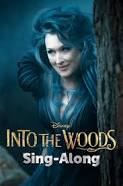

In [ ]:
text_input_example = test_data.sample().scripts.values[0]
text_input_example[:200]

"CLOSE-UP on CINDERELLA'S dirty hand as it reaches down to gather kindling.CLOSE-UP on JACK'S calloused hands as he pulls on a rope.A spaced-out twelve year-old who is trying to pull his bo cow MILKY-W"

In [ ]:
#Sample usage
predicted_rating_example = predict_imdb_rating([text_input_example], tokenizer, model)

print(f"Predicted IMDb Rating: {predicted_rating_example}")

1/1 [==============================] - 0s 60ms/step
Predicted IMDb Rating: 5


### Sample 3: The Cooler (2003)

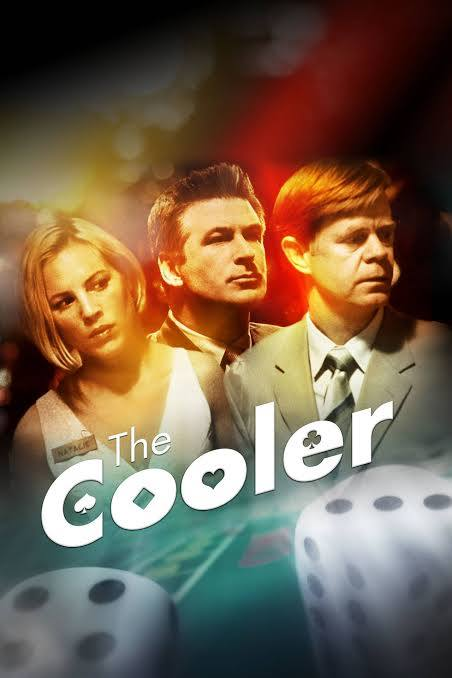

In [ ]:
text_input_example = test_data.sample().scripts.values[0]
text_input_example[:200]

'Shelly sees where this is going. Larry extends his hand..How do you do, Shelly?Shelly seated across from Nicky, Larry and Marty.Shelly seated across from Nicky, Larry and Marty.Nicky shoots a look ove'

In [19]:
#Sample usage
text_input_example = test_data.sample().scripts.values[0]
predicted_rating_example = predict_imdb_rating([text_input_example], tokenizer, model)

print(f"Predicted IMDb Rating: {predicted_rating_example}")

1/1 [==============================] - 9s 9s/step
Predicted IMDb Rating: 7


### Sample 4: Sully: Miracle on the Hudson (2016)

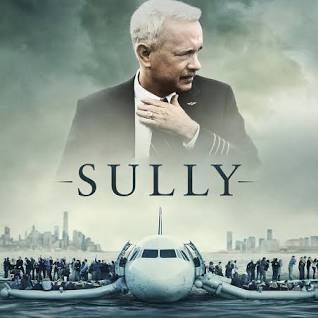

In [ ]:
text_input_example = test_data.sample().scripts.values[0]
text_input_example[:200]

'CAPTAIN “SULLY” SULLENBERGER, 57, lithe, intense, is behind the stick of this plummeting plane. ALARMS are sounding. CACOPHONY. VERTIGO. Beside Sully, First Officer -- JEFF SKILES, 49, youthful, hands'

In [ ]:
#Sample usage
predicted_rating_example = predict_imdb_rating([text_input_example], tokenizer, model)
print(f"Predicted IMDb Rating: {predicted_rating_example}")

1/1 [==============================] - 0s 59ms/step
Predicted IMDb Rating: 8


---

# Genre Classification within Movie Scripts through BERT

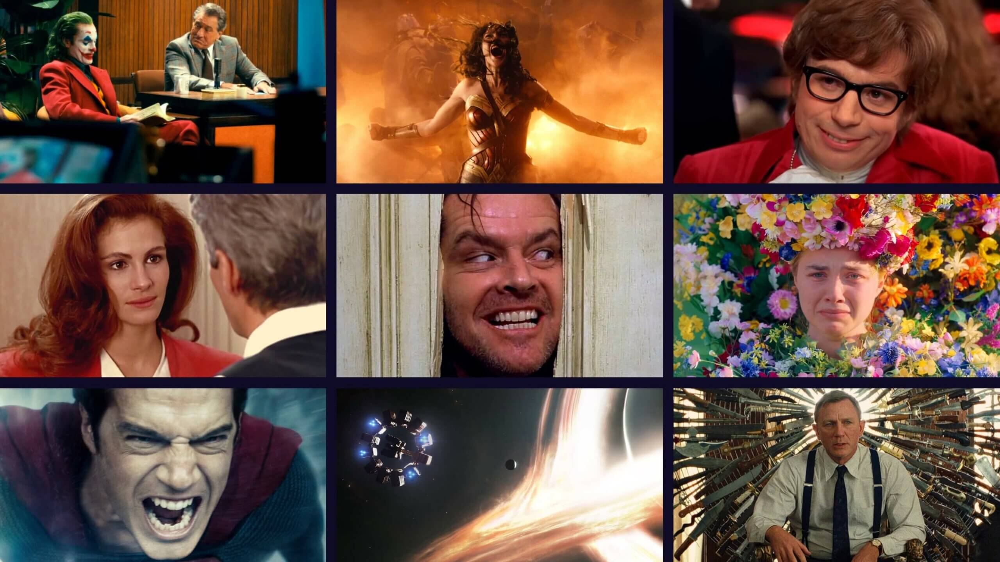

__Loading BERT Tokenizer and Model from the previous example's saved models.__

In [7]:
#Importing Bert Tokenizer and BertSequenceClassifier from offline saved model
tokenizer = BertTokenizer.from_pretrained('./Models/Pre-Trained/bert_tkz')
bert_model = transformers.TFAutoModel.from_pretrained('./Models/Pre-Trained/bert_model', num_labels=1)

All model checkpoint layers were used when initializing TFBertModel.

All the layers of TFBertModel were initialized from the model checkpoint at ../Models/Pre-Trained/bert_model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


In [8]:
genre_df = pd.read_csv('./Data/Processed/genre_dataset.csv',index_col=0)

In [9]:
genre_df.sample(3)

,scripts,genres
596,A few patients sit around fumbling with themse...,Drama
610,We see the drawn face of a young woman. Camera...,"Action, Crime, Drama, Mystery, Thriller"
225,MUSIC CUE The music fades out. TIGHT SHOT on A...,Comedy


In [10]:
print("TOTAL TYPES OF GENRES IN THE DATASET: ", genre_df.genres.nunique())

TOTAL TYPES OF GENRES IN THE DATASET:  463


In [11]:
""" 
As the genres are in irregular form and are varied in number we try to extract the top 20 most occuring genres
"""

genres_compile = []
for values in genre_df.genres.values:
    genres = values.split(', ')
    genres.sort()
    for g in genres:
        if g not in genres_compile:
            genres_compile.append(g)

In [12]:
genre_df.genres.value_counts()[1:20].to_dict()

{'Comedy, Drama, Romance': 80,
 'Comedy, Drama': 61,
 'Drama, Romance': 55,
 'Crime, Drama, Thriller': 47,
 'Comedy': 38,
 'Comedy, Romance': 37,
 'Crime, Drama, Mystery, Thriller': 33,
 'Biography, Drama': 31,
 'Drama, Thriller': 30,
 'Action, Crime, Thriller': 29,
 'Action, Crime, Drama, Thriller': 28,
 'Horror, Mystery, Thriller': 27,
 'Action, Adventure, Sci-Fi': 26,
 'Horror, Thriller': 19,
 'Biography, Drama, History': 18,
 'Drama, Mystery, Thriller': 18,
 'Crime, Drama': 17,
 'Action, Adventure, Thriller': 17,
 'Action, Adventure, Sci-Fi, Thriller': 14}

In [13]:
print("TOTAL MOVIES in top 10 Genres: ", genre_df.genres.value_counts()[1:10].values.sum())

TOTAL MOVIES in top 10 Genres:  412


__Taking 412 movies of the top 10 genres into consideration__

In [14]:
genre_df_updated= genre_df[genre_df.isin(genre_df.genres.value_counts()[1:10].to_dict().keys()).any(axis=1)]

In [15]:
movie_scripts = genre_df_updated.scripts.values.tolist()
tokenized_inputs = tokenizer(movie_scripts, padding=True, truncation=True, return_tensors='tf',max_length=512)

In [16]:
#Random Over Sampling
sampling_strategy = {1: 250, 2: 250,3: 250,4: 250,5: 250,6: 250,7: 250,8: 250,9: 250}
y = 80
sampling_strategy = {x:y for x in genre_df_updated['genres'].unique()}
ROS = RandomOverSampler(sampling_strategy=sampling_strategy)

X, y = ROS.fit_resample(tokenized_inputs['input_ids'], genre_df_updated['genres'].values.tolist())

X = tf.convert_to_tensor(X)


### MultiLabelBinarizer 
   - `MultiLabelBinarizer` is a scikit-learn utility that transforms a list of sequences (in this case, genre strings) into a binary matrix.
   - It is used here to convert the genre labels into a binary matrix where each column corresponds to a unique genre, and each row corresponds to a movie. If a movie belongs to a particular genre, the corresponding entry in that genre's column is set to 1; otherwise, it's 0.
   - The `fit_transform` method is applied to the list comprehension that splits the comma-separated genre strings into lists of genres.
   - The variable `num_classes` is assigned the number of unique classes (genres) present in the dataset. This is determined by the length of `mlb.classes_`.

In the context of the movie genres in the ``genres_df`` dataset and counts, this approach is useful for handling __multi-label classification__ tasks where a movie can belong to multiple genres simultaneously. It allows the model to predict the presence or absence of each genre independently. <br>
__For example__, a movie labeled 'Comedy, Drama, Romance' will have binary labels [1, 1, 1, 0, 0, ...] where each position in the array corresponds to a unique genre.

In [18]:
#Converting class labels to binary labels with MultiLabelBinarizer()
class_labels = y

mlb = MultiLabelBinarizer()
binary_labels = mlb.fit_transform([label.split(', ') for label in class_labels])
num_classes = len(mlb.classes_)

In [19]:
# Saving the fitted MultiLabelBinarizer to a file using pickle
with open('./Models/mlb_model.pkl', 'wb') as file:
    pickle.dump(mlb, file)

## Model Architecture

**Input Layer Setup:**
  - A __TensorFlow Keras Input layer__ is created, specifying the shape as __(512,)__, the data type as tf.int32, and the name as "input_ids." This layer will serve as the input for tokenized sequences.

**BERT Model Integration:**
  - The BERT model (`bert_model`) is applied to the input_ids using functional API syntax. The [0] indexing extracts the model's output tensor, representing contextualized representations of each token in the input sequence.
  - The special __[CLS] token representation is extracted__ from the output tensor by selecting all rows (:) and only the first column (0).

**Dropout and Dense Layers:**
  - A dropout layer is added with a __dropout rate__ of 0.50. This helps __prevent overfitting__ by randomly setting half of the input units to 0 during training.
  - A dense layer with the number of neurons equal to the number of unique classes (`num_classes`) is added. The activation function is set to 'sigmoid' as this is a binary classification task, and the model aims to predict the probability of each class independently.
  
**Model Compilation:**
  - The TensorFlow Keras Model is instantiated using the defined input and output layers.
  - The model is compiled with the __Adam optimizer__, a learning rate of __0.00001__, __binary crossentropy__ as the loss function (suitable for binary classification), and accuracy as the metric for evaluation during training.

In [34]:
#Building the BERT model
input_ids = tf.keras.layers.Input(shape = (512,), dtype = tf.int32, name = "input_ids")
#Input(shape=(512,), dtype=tf.int32, name="input_ids")
outputs = bert_model(input_ids)[0]
cls_token = outputs[:, 0, :]

#adding dropout layer
x = tf.keras.layers.Dropout(0.50)(cls_token)

#Using a dense layer of 9 neurons as the number of unique categories is . 
out = tf.keras.layers.Dense(num_classes, activation = 'sigmoid')(x)

model = tf.keras.Model(inputs = input_ids, outputs = out)
model.compile(tf.keras.optimizers.Adam(learning_rate = 0.00001), loss = 'binary_crossentropy', metrics = ['accuracy'])

## Fine-Tuning the Model

In [ ]:
# Training the model
model.fit(
    x=tf.convert_to_tensor(X),
    y=binary_labels,
    epochs=4,
    batch_size=4,
)

Epoch 1/4
180/180 [==============================] - 105s 438ms/step - loss: 0.5296 - accuracy: 0.2653
Epoch 2/4
180/180 [==============================] - 80s 442ms/step - loss: 0.3819 - accuracy: 0.4278
Epoch 3/4
180/180 [==============================] - 80s 444ms/step - loss: 0.2291 - accuracy: 0.5069
Epoch 4/4
180/180 [==============================] - 80s 444ms/step - loss: 0.1341 - accuracy: 0.5444


In [35]:
def predict_script_genre(text,model,tokenizer,mlb):
    #Tokenizing the text
    tokenized_text = tokenizer([text], padding='max_length', truncation=True, return_tensors='tf',max_length=512)

    predictions = model.predict(tokenized_text['input_ids'])
    
    #Converting the predictions to binary labels using a threshold (eg. 0.5)
    threshold = 0.5
    binary_predictions = (predictions>threshold).astype(int)
    
    predicted_labels = mlb.inverse_transform(binary_predictions)
    
    return predicted_labels

### Sample 1: Taking a Romantic Script Generated by ChatGPT for predicting Genre with our Model

In [ ]:
romatic_script = """ 
Title: "Moonlit Serenade"

INT. COZY CANDLELIT RESTAURANT - NIGHT

Soft piano music plays as the waiter lights the candles on the table. Enter EMMA, an elegant woman in a beautiful dress, nervously waiting for her date.

JASON, a charming man in a suit, enters the restaurant. He spots Emma and approaches with a warm smile.

JASON
(smiling)
Emma! You look absolutely stunning.

EMMA
(blushing)
Thank you, Jason. You look quite handsome yourself.

They share a genuine smile as they sit down at the table. The waiter takes their orders, and a romantic atmosphere fills the air.

JASON
I have to say, Emma, I've been looking forward to this evening all week.

EMMA
(smiling)
Me too, Jason. There's just something magical about a candlelit dinner.

As they engage in conversation, their connection deepens. Jason reaches across the table, gently touching Emma's hand.

JASON
(softly)
You know, there's something about your smile that lights up the entire room.

EMMA
(teasingly)
Flattery will get you everywhere, Jason.

They share a laugh, and the conversation flows effortlessly.

EXT. ROOFTOP TERRACE - LATER

After dinner, Jason leads Emma to a rooftop terrace where fairy lights twinkle overhead. A cool breeze carries the scent of roses.

JASON
(smiling)
I thought we could enjoy the night sky from up here.

They find a cozy spot with a breathtaking view of the city skyline. Jason takes out a small guitar.

JASON (CONT'D)
I have a little surprise for you.

He begins to play a sweet melody, and the atmosphere becomes even more enchanting.

EMMA
(looking touched)
Jason, this is beautiful.

JASON
(looking into her eyes)
It's nothing compared to the beauty I see in your eyes.

As the serenade continues, Jason stands and extends his hand.

JASON (CONT'D)
May I have this dance?

EMMA
(smiling)
I would love to.
They dance under the moonlight, wrapped in the music and each other's company. The connection between them deepens as they share a tender kiss.
FADE OUT.

"""

In [ ]:
predicted_genre = predict_script_genre(romatic_script, model, tokenizer, mlb)
print(predicted_genre[0])

1/1 [==============================] - 0s 63ms/step
('Biography', 'Mystery', 'Romance', 'Thriller')


### Sample 2: Pixels (2015)

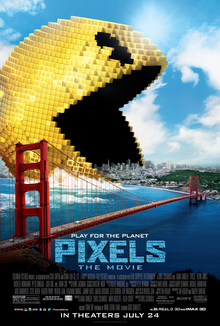

In [43]:
#Sample usage
text_input_example = genre_df.sample().scripts.values[0]
print(text_input_example[:200])

Our hero, SAM BRENNER, 13, rides his bike through the sub Fast, crazed. CHEAP TRICK’S “SURRENDER” (BUDDAKAN VERSION PLAYS AS CREDITS BEGIN.As the song continues, WILL COOPER, age 13, is mowing his law


In [44]:
predicted_genre = predict_script_genre(text_input_example, model, tokenizer, mlb)

print(predicted_genre[0])

1/1 [==============================] - 4s 4s/step
('Comedy', 'Drama')


### Sample 3: Sweet November (2001)

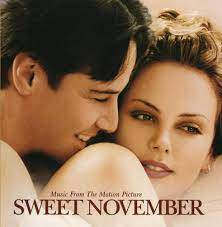

In [49]:
#Sample usage
text_input_example = genre_df.sample().scripts.values[0]
print(text_input_example[1000:1200])

peed-dials on a cell phone as he passes Angelica. Entering a walk-in closet, he dresses in a hurry.Fax in hand, Nelson speed-dials on a cell phone as he passes Angelica. Entering a walk-in closet, he 


In [50]:
predicted_genre = predict_script_genre(text_input_example, model, tokenizer, mlb)
print(predicted_genre[0])

1/1 [==============================] - 5s 5s/step
('Drama', 'Romance')


### Sample 4: Charlie's Angel (2000)

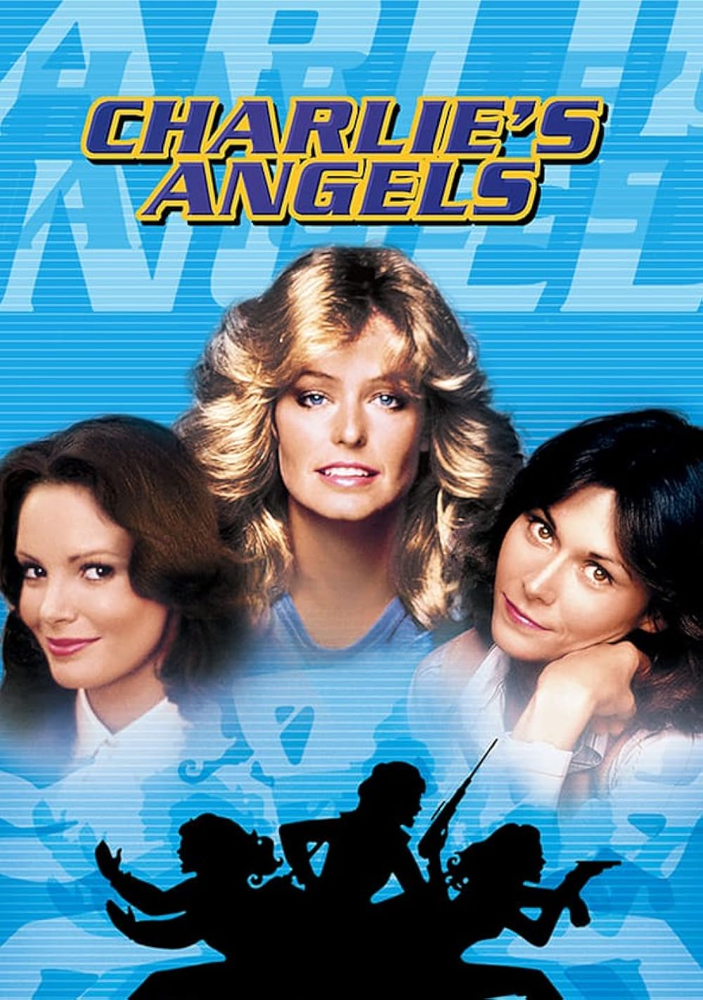

In [53]:
#Sample usage
text_input_example = genre_df.sample().scripts.values[0]
print(text_input_example[1000:1200])

hello to NATALIE THOMPSON, Charlie's second angel. At a glance, she's the brainy-shy girl next door.You crazy bastard!(still with James Earl Jones' voice(now in her real voiceDamn I hate to fly.Now, M


In [55]:
predicted_genre = predict_script_genre(text_input_example, model, tokenizer, mlb)
print(predicted_genre[0])

1/1 [==============================] - 4s 4s/step
('Drama',)


### Sample 5: Transformers (2007)
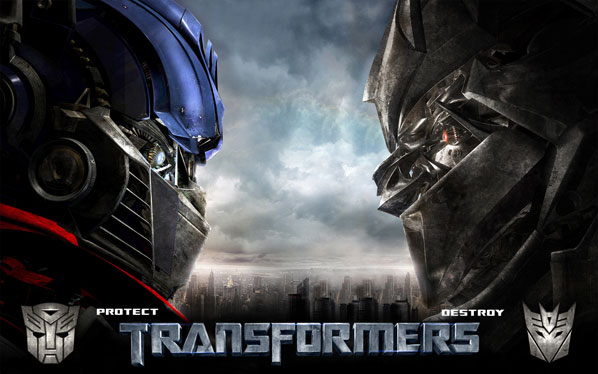

In [56]:
#Sample usage
text_input_example = genre_df.sample().scripts.values[0]
print(text_input_example[1000:1200])

OT #1 ve Unidentified aircraft, we will escort you to U.S. SOCCENT air base -- if you do not comply, we will use deadly force. The jet pilot lines up a heat-seeking reticule on  ¢ae vi a TONE indicate


In [57]:
predicted_genre = predict_script_genre(text_input_example, model, tokenizer, mlb)
print(predicted_genre[0])

1/1 [==============================] - 4s 4s/step
('Comedy', 'Drama', 'Romance')


In [54]:
# #Saving the model weights
# model.save('./Models/bert_genre_model.h5')

In [38]:
#Loading the model weights
model.load_weights('./Models/bert_genre_model.h5')

---

# Movie Age Restriction Prediction through Movie Scripts leveraging BERT Model 

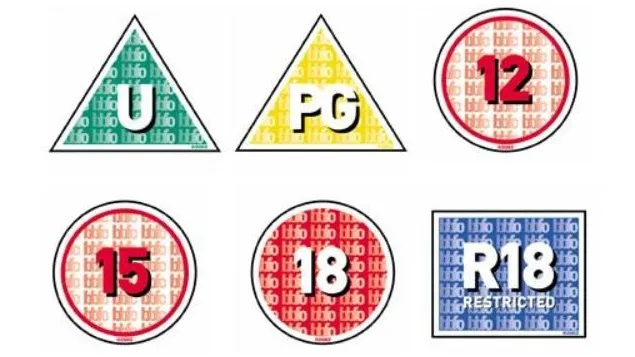


As there were over 150 countries in the dataset, we only considered (while preprocessing) the numerical age available, and not the `u`/`a`/`r` ratings.

In [2]:
age_df = pd.read_csv('./Data/Processed/age_dataset.csv',index_col=0)

In [3]:
age_df.sample(3)

,scripts,age restriction
247,"We move through a spooky shrouded parlor, as a...",12.0
773,CLOSE ON BLUE EYES as they snap open. Woken fr...,16.0
528,(flirtatiousWhat's your name girl? Precious bl...,14.0


In [4]:
len(age_df)

1604

<AxesSubplot:xlabel='count', ylabel='age restriction'>

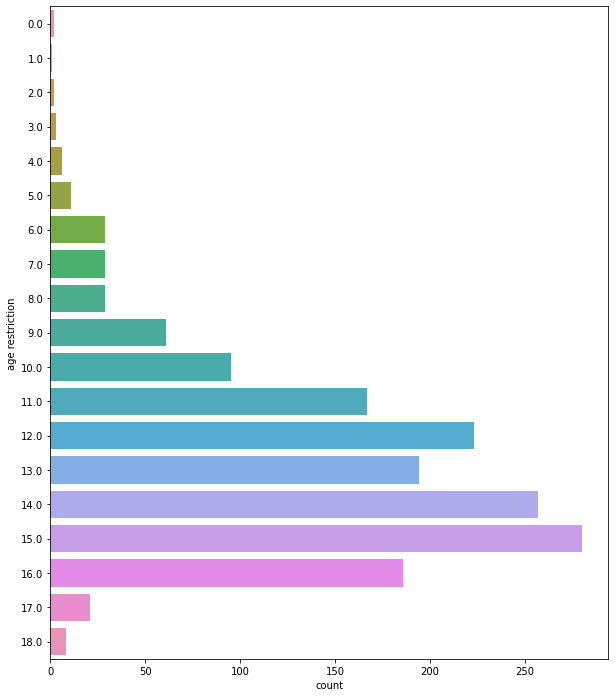

In [5]:
plt.figure(figsize=(10,12))
sns.countplot(data = age_df, y='age restriction')

__Inference:__ More Number of data points of the classes - from the age basket of - 11 to 16 years old.

## Bert Pre-Trained Models

The BERT model for sequence classification (`TFBertForSequenceClassification`) are imported from the 'bert-large-uncased' pre-trained model. Let's delve into the details:

**BertTokenizer**
   - **Type:** `BertTokenizer` is a tokenizer from the transformers library specifically designed for BERT models.
   - **Initialization:** It is initialized using the `from_pretrained` method with the 'bert-large-uncased' model.
   - **Details:** This tokenizer is responsible for converting raw text into a format suitable for input into the BERT model. It handles tokenization, padding, and truncation.

**TFBertForSequenceClassification:**
   - **Type:** `TFBertForSequenceClassification` is a BERT model variant specialized for sequence classification tasks.
   - **Initialization:** Similar to the tokenizer, it is initialized using the `from_pretrained` method with 'bert-large-uncased'. Additionally, `num_labels` is set to 1, indicating a binary classification task.
   - **Details:** This model is specifically tailored for tasks where the goal is to classify a sequence of tokens into one or more predefined categories. It includes a classification head on top of the BERT base model.

### Difference from TFAutoModel used in the IMDB Rating Classification
   - `TFAutoModel` is a generic class that loads any pre-trained model based on the provided model name or path. It is more versatile as it can be used for various tasks (e.g., classification, question answering) by adding a task-specific head on top of the base model.
   - `TFBertForSequenceClassification`, on the other hand, is a task-specific model with a built-in classification head. It is designed specifically for sequence classification tasks and provides a more convenient interface for such tasks.

In [6]:
#Importing Bert Tokenizer and BertSequenceClassifier from offline saved model
tokenizer = BertTokenizer.from_pretrained('bert_tkz')
bert_model = TFBertForSequenceClassification.from_pretrained('bert-large-uncased', num_labels=1)

"""   
Saving the Model...
The code below `bert_model.save_pretrained('bert_model_sequence')` saves the entire model, including its architecture and learned parameters, 
to a directory named 'bert_model_sequence'. This allows for later retrieval and re-use of the trained model without retraining.
"""

bert_model.save_pretrained('bert_model_sequence')

All PyTorch model weights were used when initializing TFBertForSequenceClassification.

Some weights or buffers of the TF 2.0 model TFBertForSequenceClassification were not initialized from the PyTorch model and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [7]:
# Datafrrame Split with columns 'Rating' and 'Script'
train_data, test_data = train_test_split(age_df, test_size=0.2, random_state=42)

In [8]:
#Tokenizing and encoding the scripts
train_encodings_x = tokenizer(list(train_data['scripts']), truncation=True, padding=True, max_length=512, return_tensors='tf')
test_encodings_x = tokenizer(list(test_data['scripts']), truncation=True, padding=True, max_length=512, return_tensors='tf')

In [9]:
#Encoding the labels
train_labels_y = tf.convert_to_tensor(list(train_data['age restriction']))
test_labels_y = tf.convert_to_tensor(list(test_data['age restriction']))

In [10]:
#Random Over Sampling
sampling_strategy = {1: 250, 2: 250,3: 250,4: 250,5: 250,6: 250,7: 250,8: 250,9: 250}
y = 250
sampling_strategy = {x:y for x in range(1,10)}
ROS = RandomOverSampler(sampling_strategy=sampling_strategy)

X, y = ROS.fit_resample(train_encodings_x['input_ids'], train_data['age restriction'].values)

train_labels_y = tf.convert_to_tensor(y, dtype = 'int32')
X = tf.convert_to_tensor(X)

In [11]:
#Building the BERT model
input_ids = Input(shape=(512,), dtype=tf.int32, name="input_ids")
# attention_mask = Input(shape=(512,), dtype=tf.int32, name="attention_mask")
outputs = bert_model(input_ids)

#Building and compiling the overall model
model = Model(inputs=[input_ids], outputs=outputs.logits)
optimizer = Adam(learning_rate=0.000005)
model.compile(optimizer=optimizer, loss=tf.keras.losses.MeanSquaredError())

In [12]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_ids (InputLayer)      [(None, 512)]             0         
                                                                 
 tf_bert_for_sequence_class  TFSequenceClassifierOut   335142913 
 ification (TFBertForSequen  put(loss=None, logits=(             
 ceClassification)           None, 1),                           
                              hidden_states=None, at             
                             tentions=None)                      
                                                                 
Total params: 335142913 (1.25 GB)
Trainable params: 335142913 (1.25 GB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# Training the model
model.fit(
    x={'input_ids': X},
    y=train_labels_y,
    epochs=3,
    batch_size=4)

Epoch 1/3


2023-11-27 16:04:48.840752: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7fb1a81dddb0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-11-27 16:04:48.840771: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA RTX A6000, Compute Capability 8.6
2023-11-27 16:04:48.843491: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-11-27 16:04:49.047760: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8902
2023-11-27 16:04:49.094902: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


850/850 [==============================] - 400s 440ms/step - loss: 17.2100
Epoch 2/3
850/850 [==============================] - 375s 441ms/step - loss: 4.0482
Epoch 3/3
850/850 [==============================] - 375s 441ms/step - loss: 2.1183


In [ ]:
# Evaluating the model
model.evaluate(
    x={'input_ids': test_encodings_x['input_ids']},
    y=test_labels_y
)

11/11 [==============================] - 13s 904ms/step - loss: 6.5324


6.5324015617370605

In [ ]:
#Saving the model architecture and weights
model.save('./Models/bert_age_restrictions_model.h5')

In [ ]:
model.load_weights('./Models/bert_age_restrictions_model.h5')

In [41]:
#User Defined Function to predict age restriction based on text input
def predict_age_restriction(text_input, tokenizer, model):
    
    input_encoding, prediction, predicted_rating = None, None, None
    
    #Tokenizing and encode the input text
    input_encoding = tokenizer(text_input, truncation=True, padding='max_length', max_length=512, return_tensors='tf')

    #Making prediction
    prediction = model.predict(x={'input_ids': input_encoding['input_ids']})
    print(prediction)

    #Extracting the predicted rating (assuming the model is designed for regression)
    predicted_rating = np.squeeze(prediction)

    return predicted_rating

### Sample 1: Hollow Man (2000)

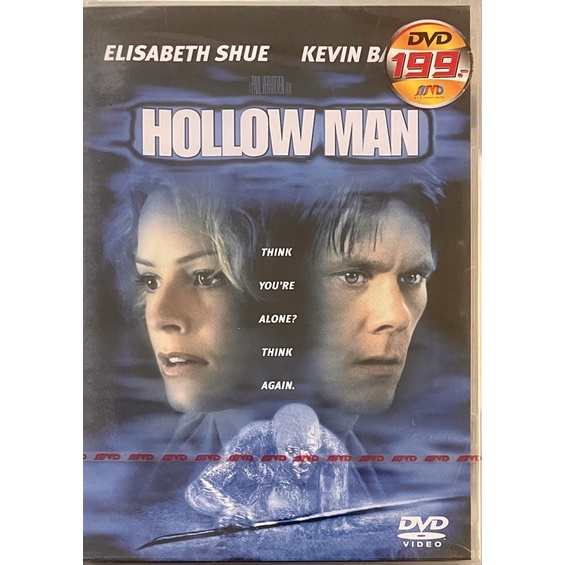

In [42]:
#Sample usage
text_input_example = age_df.sample().scripts.values[0]
text_input_example[:200]

"In the background we hear Jay Leno's monologue from the  Tonight Show. A small lamp and the glow from a computer  screen illuminates SEBASTIAN CAINE, late twenties with  the shabby good looks of a per"

In [35]:
predicted_age_restriction_example = predict_age_restriction(text_input_example, tokenizer, model)
print(f"Predicted IMDb Rating: {predicted_age_restriction_example}")

1/1 [==============================] - 0s 60ms/step
Predicted IMDb Rating: 13.297293663024902


### Sample 2: Taking a Reddit Post

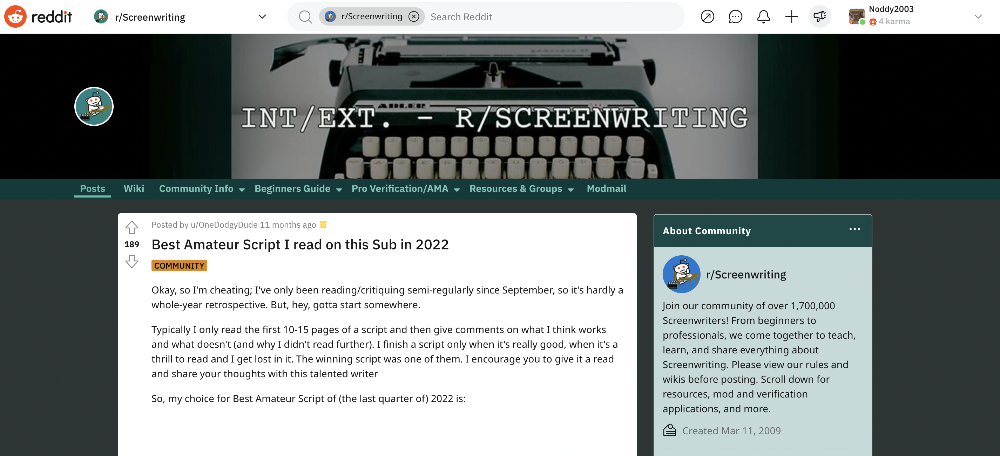

In [ ]:
reddit_post = """ 
 Okay, so I'm cheating; I've only been reading/critiquing semi-regularly since September, so it's hardly a whole-year retrospective. But, hey, gotta start somewhere.

Typically I only read the first 10-15 pages of a script and then give comments on what I think works and what doesn't (and why I didn't read further). I finish a script only when it's really good, when it's a thrill to read and I get lost in it. The winning script was one of them. I encourage you to give it a read and share your thoughts with this talented writer

So, my choice for Best Amateur Script of (the last quarter of) 2022 is: 

"""

In [ ]:
predicted_rating_example = predict_age_restriction(reddit_post, tokenizer, model)
print(f"Predicted IMDb Rating: {predicted_rating_example}")

1/1 [==============================] - 0s 61ms/step
Predicted IMDb Rating: 13.773266792297363


---